# Imports

In [1]:
import os
from pathlib import Path
import re

import pandas as pd
import matplotlib.pyplot as plt


In [2]:
directory = Path(os.path.abspath('')).parents[0]
sample_data_dir = os.path.join(directory,"data/rvl_cdip_1000_samples")
temp_data_dir = os.path.join(directory,"data/temp")
processed_data_dir = os.path.join(directory,"data/processed")
output_folder_dir = os.path.join(directory,"data/temp")



datasets_data_dir = os.path.join(directory,"data/datasets")

text_dataset_path = datasets_data_dir+"/extracted_dataset.csv"

text_df = pd.read_csv(text_dataset_path)
text_df.head(10)

,image,image_class,text
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...
5,image_0036.png,0,ae.ne |.oe.f.Awe.¢.¢.§.io].WAVY.MESON POEL COM...
6,image_0535.png,0,—af.THERAPY AIR SUPPORT SYSTEMS INC..19912 PON...
7,image_0534.png,0,Guu._.Southern Illinois.University at Carbonda...
8,image_0050.png,0,"ee Aorta, Beas Re oy ory.Be eae OE Soe TAKES.«..."
9,image_0722.png,0,"Wy 7.QO syaniosph ctor o>, em.ra 31 Dawson Ave..."


In [3]:
text_dataset_path = datasets_data_dir+"/extracted_dataset.csv"

text_df = pd.read_csv(text_dataset_path)
text_df.head(10)

,image,image_class,text
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...
5,image_0036.png,0,ae.ne |.oe.f.Awe.¢.¢.§.io].WAVY.MESON POEL COM...
6,image_0535.png,0,—af.THERAPY AIR SUPPORT SYSTEMS INC..19912 PON...
7,image_0534.png,0,Guu._.Southern Illinois.University at Carbonda...
8,image_0050.png,0,"ee Aorta, Beas Re oy ory.Be eae OE Soe TAKES.«..."
9,image_0722.png,0,"Wy 7.QO syaniosph ctor o>, em.ra 31 Dawson Ave..."


# Text Cleaning

In [4]:
def clean_text(text):
     # Remove special characters, keeping alphanumeric characters and periods
    cleaned_text = re.sub(r'[^\w\s.]', '', text)

    cleaned_text = re.sub(r'\.{2,}', '.', cleaned_text)

    cleaned_text = re.sub(r'\.(\s*\.)+', '.', cleaned_text)
    
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()
    
    return cleaned_text

In [5]:
print(text_df['text'][0])
print('\n\n')
print(clean_text(text_df['text'][0]))

nairo |.Bis {NBIFO Institut fiir biologische Forschung GmbH.Vertragsforschung.DEPT. BC.Rion ease) 203982.‘Blox 289 200362.Ree Aare bid.Dresdner Bank AG Koln.Fo 9922 741 Uz 57080040).Slaclspatasse Kain..Sorazise uz sroso19e).Posechocs Kain..ee iSb0 82-504 (LZ 37010080).“RRGIFD institut Wr biologische Forschung FuggerstiaGe 3 0.5000 Kéin 90..Dr. A. Swart:.Dept. Biological Toxicology..TNO-CIVO Toxicology and Nutrition Institute.P.O. Box 360.VB1335/AZ-HE.zai 08, Oot-89.ben HEM / MAO.UneerZeichen 3134 TNO «LET.pwr.NL-3700 Ad Zeist.The Netherlands.Sr iks |}.Koin 28-Nov-89.qy.e.: Lung function determinations for the INBIFO study P 0500/3136.‘and the CRC study B6005.aay.Dear Doctor Zwart:.hank you very much for submitting your preliminary reports fo URC.Thank Vero reyarding the lung function determinations carried out..and Te above mentioned studies. We discussed both reports and..jn ld like to make the following comments..with xegard to the determinations of tidal volume, breathing ffe°..Yaen

In [6]:
text_df['text_body']  = text_df['text'].apply(lambda x: clean_text(x))

# Correct Spellings

In [8]:
import pkg_resources
from symspellpy import SymSpell, Verbosity

# Load dictionary
sym_spell = SymSpell(max_dictionary_edit_distance=6, prefix_length=7, count_threshold= 15)
dictionary_path = pkg_resources.resource_filename(
    "symspellpy", "frequency_dictionary_en_82_765.txt")
bigram_path = pkg_resources.resource_filename(
    "symspellpy", "frequency_bigramdictionary_en_243_342.txt")

sym_spell.load_dictionary(dictionary_path, term_index=0, count_index=1)
sym_spell.load_bigram_dictionary(bigram_path, term_index=0, count_index=2)

True

In [9]:
def correct_misspelled_text(text: str) -> str:
    
    suggestions = sym_spell.lookup_compound(text, max_edit_distance=4, ignore_term_with_digits= True, ignore_non_words= True)
    
    corrected_text = ''.join([str(suggestion) for suggestion in suggestions])
    return corrected_text


In [11]:
input_text = text_df["text"][0]
print('From RAW Text')
print(correct_misspelled_text(input_text),'\n\n')


print('From Clean Text')
input_text = text_df["text_body"][0]
print(correct_misspelled_text(input_text))

From RAW Text
cairo bis NBIFO institute fair biologist he for chung mph extras forcing DEPT BC iron ease 203982 box 289 200362 free a are bid dresden bank AG kiln of 9922 741 us 57080040 slacks tasse kain so raise us sroso19e pose chocs kain be iSb0 82 504 LZ 37010080 RRGIFD institute or biologist he for chung fugger stage 3 0 5000 kin 90 or a swart dept biological toxicology TNO CIVO toxicology and nutrition institute to box 360 VB1335 AZ HE mai 08 not 89 ben HEM MAO under lichen 3134 TNO LET per NL 3700 and zeist the netherlands or is join 28 nov 89 eye lung function determinations for the INBIFO study a 0500 3136 and the CRC study B6005 may dear doctor wart hank you very much for submitting your preliminary reports of URC thank very regarding the lung function determinations carried out and the above mentioned studies we discussed both reports and in old like to make the following comments with regard to the determinations of tidal volume breathing fee agency and ventilator flow we 

In [12]:
# text_df['text_refined'] = text_df["text"].apply(lambda x: correct_misspelled_text(x))
# text_df.to_csv(datasets_data_dir+'/extracted_refined_dataset.csv',index=False)


In [13]:
text_df = pd.read_csv(datasets_data_dir+'/extracted_refined_dataset.csv')
text_df

,image,image_class,text,text_body,text_refined
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,cairo bis NBIFO institute fair biologist he fo...
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,aqua lisa 2 30 48 to samey PHILIP MORRIS us a ...
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,fare fer pos CG NOC near jar a REYNOLDS TOBACC...
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,a 0 a TY or marco HN roeg holt barn 2h 9 57 ca...
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,in GALLAHER LIMITED no a a a HINGEWAY LONDON W...
...,...,...,...,...,...
995,image_0837.png,9,got.we wes.FROM THE OFFICE OF U.S. SENATOFP.WA...,got.we wes.FROM THE OFFICE OF U.S. SENATOFP.WA...,got we was FROM THE OFFICE OF us SENATOFP WARE...
996,image_0189.png,9,"JOC L403 070.“>.‘WELLS, RICH, GREENE IN CANADA...",JOC L403 070.WELLS RICH GREENE IN CANADA .Well...,JOC L403 070 WELLS RICH GREENE IN CANADA welly...
997,image_0764.png,9,y.Institute.¥ hits b:.acks . *.Nat curbs = | S...,y.Institute. hits b.acks .Nat curbs Smoking re...,a institute hits backs nat curbs smoking repor...
998,image_0994.png,9,The Arizona Republic/THE PHOENIX GAZETTE . Wed...,The Arizona RepublicTHE PHOENIX GAZETTE . Wed ...,the arizona republic THE PHOENIX GAZETTE wed m...


# WordCloud

Image Class : 0


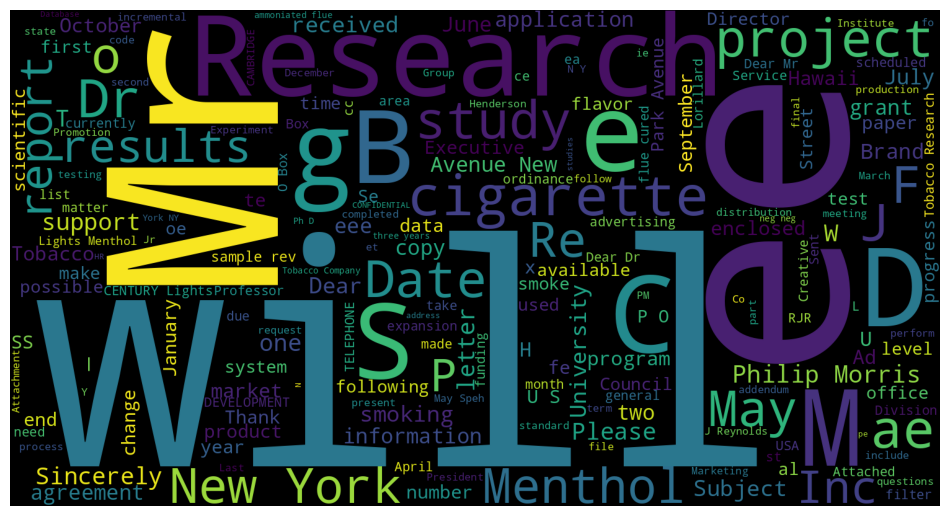




###################################################################################################################################################### 

Image Class : 1


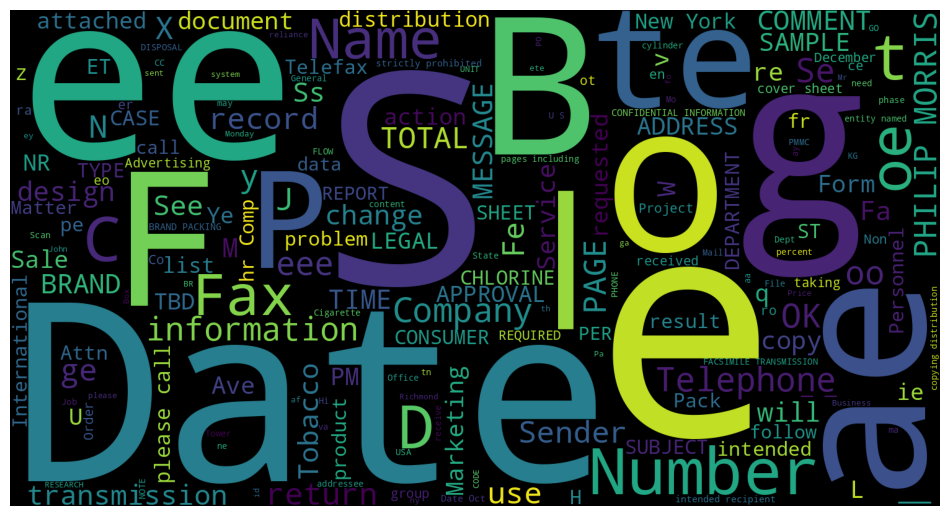




###################################################################################################################################################### 

Image Class : 10


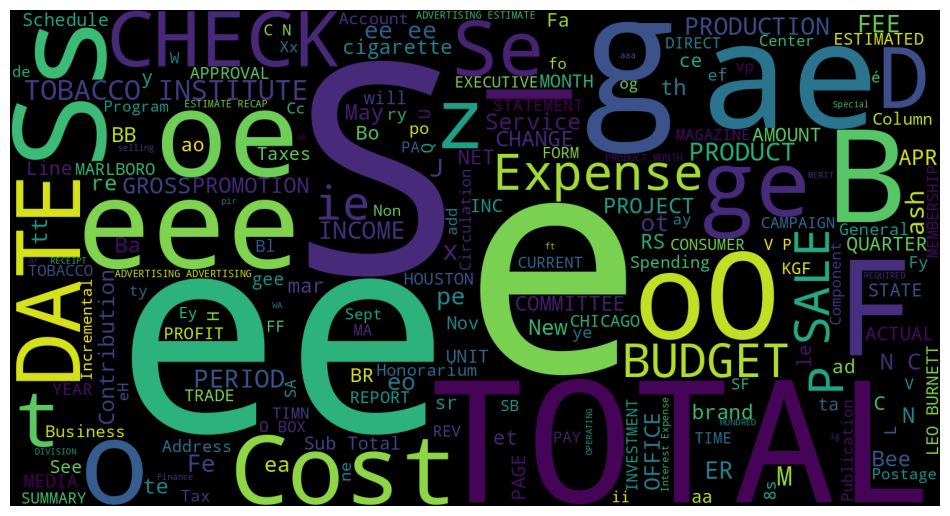




###################################################################################################################################################### 

Image Class : 11


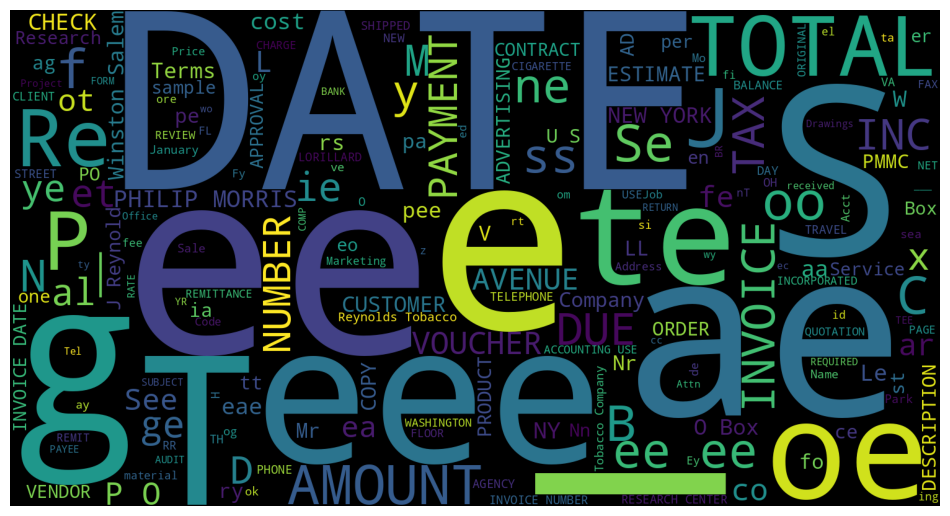




###################################################################################################################################################### 

Image Class : 12


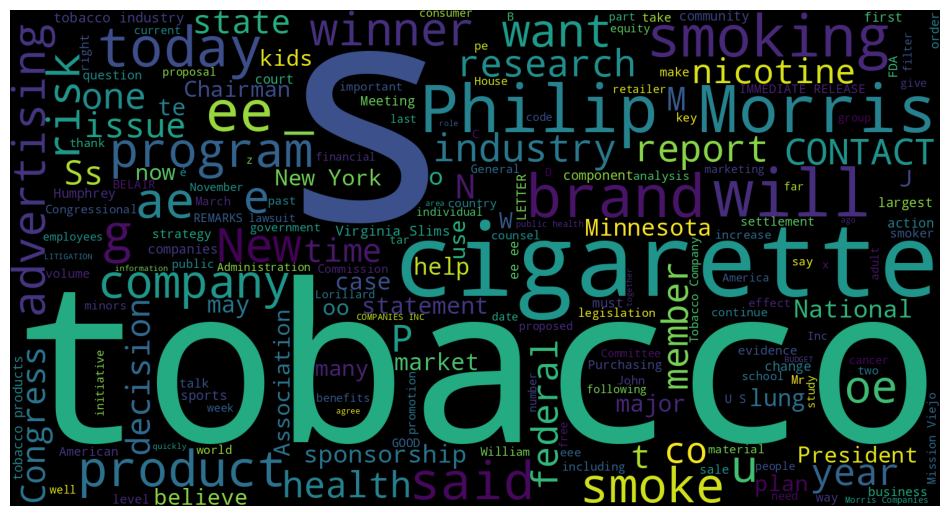




###################################################################################################################################################### 

Image Class : 13


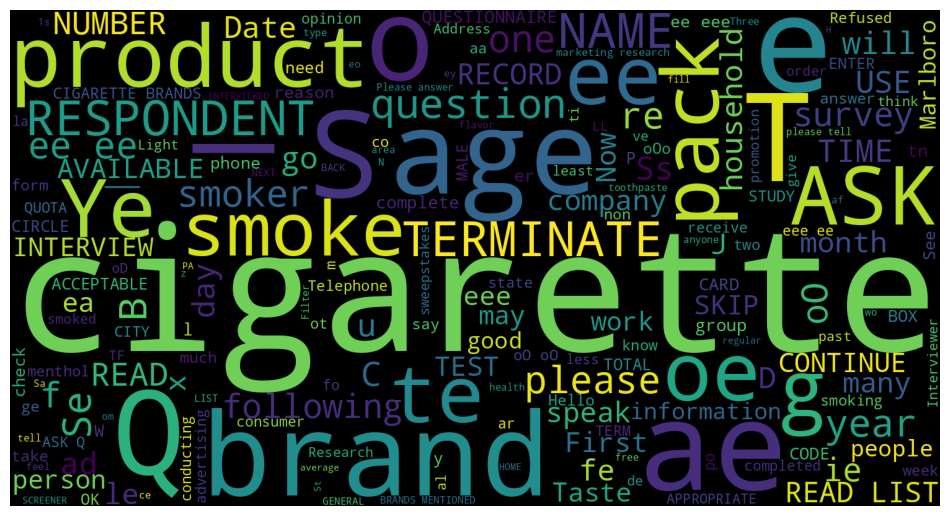




###################################################################################################################################################### 

Image Class : 14


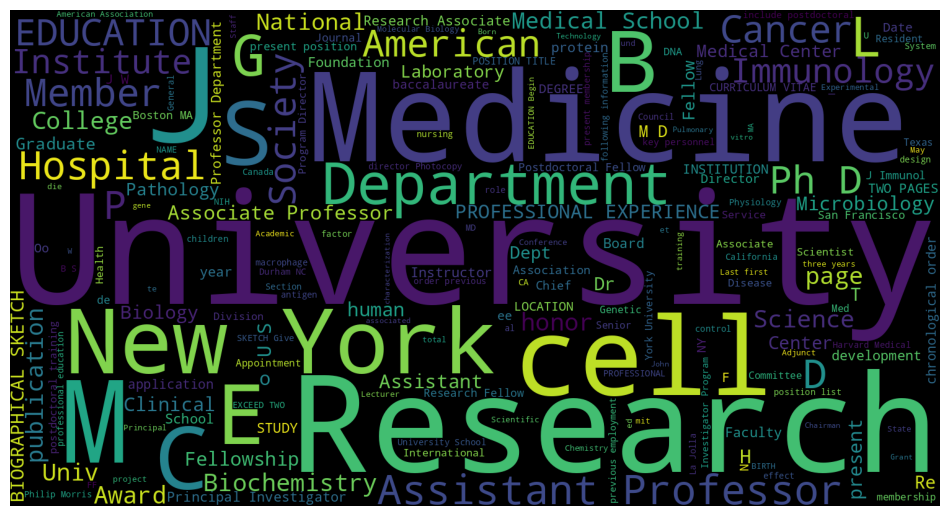




###################################################################################################################################################### 

Image Class : 15


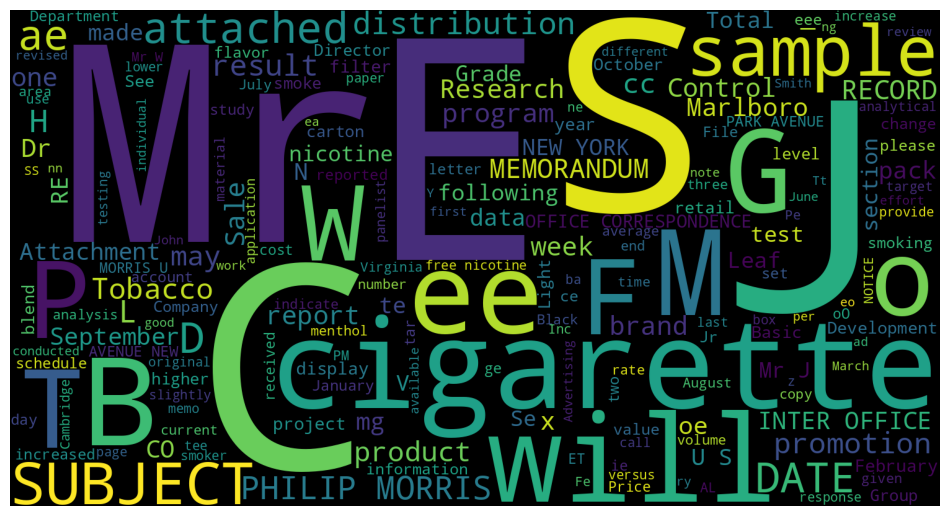




###################################################################################################################################################### 

Image Class : 2


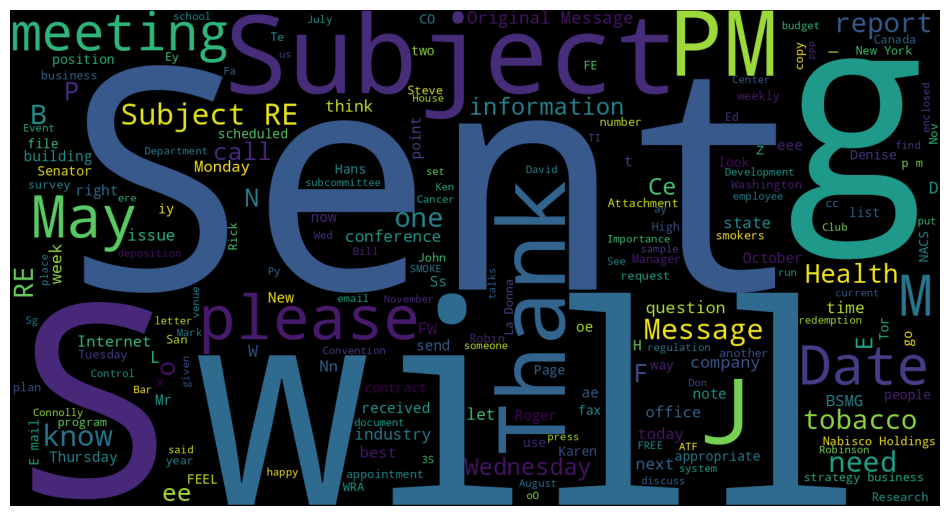




###################################################################################################################################################### 

Image Class : 3


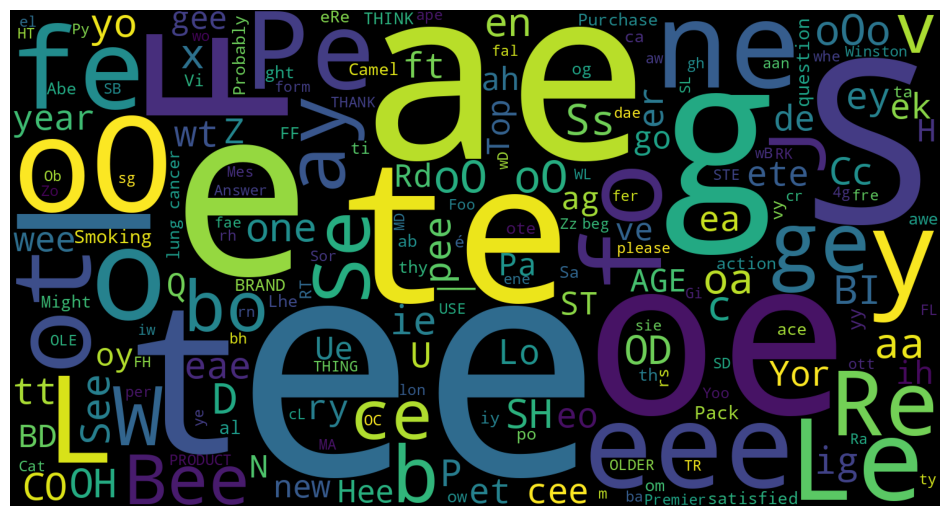




###################################################################################################################################################### 

Image Class : 4


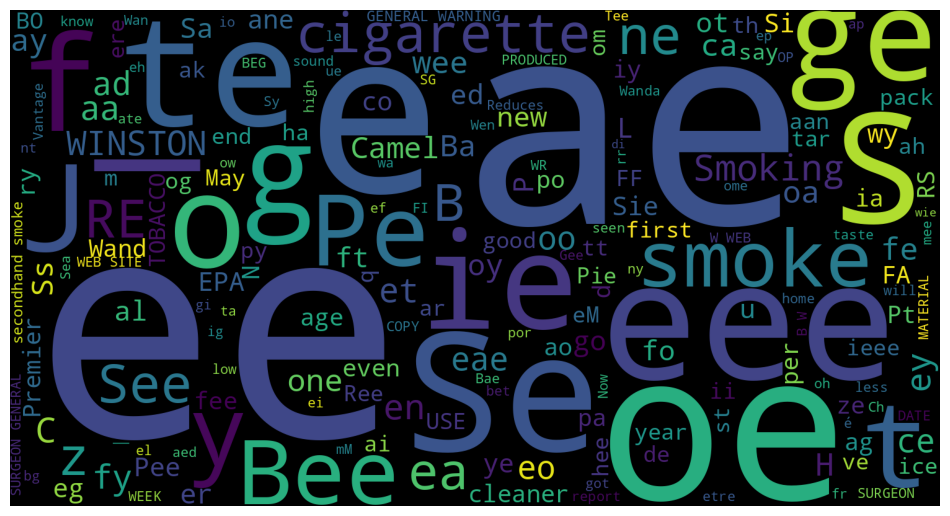




###################################################################################################################################################### 

Image Class : 5


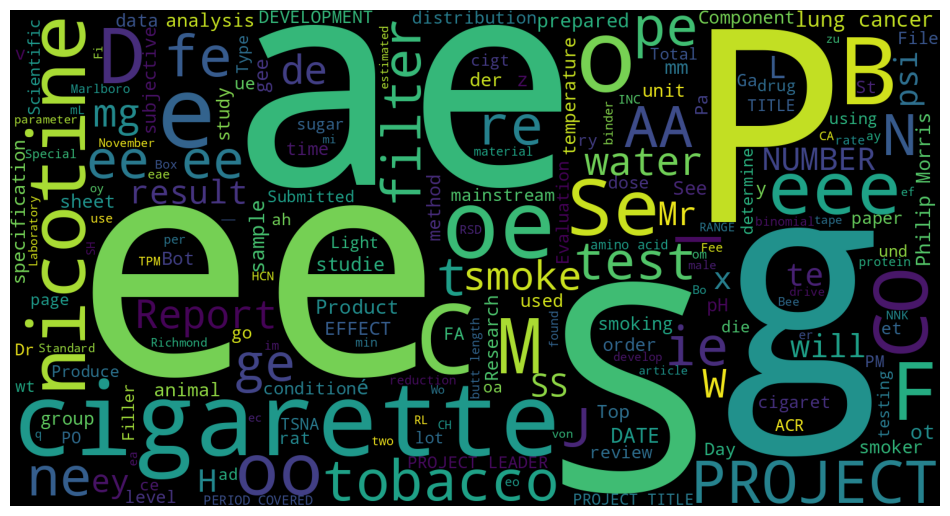




###################################################################################################################################################### 

Image Class : 6


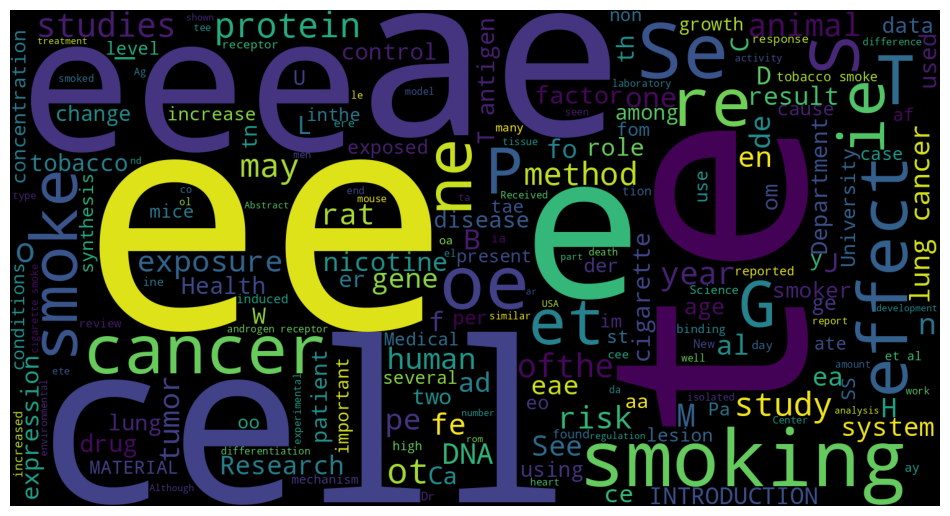




###################################################################################################################################################### 

Image Class : 7


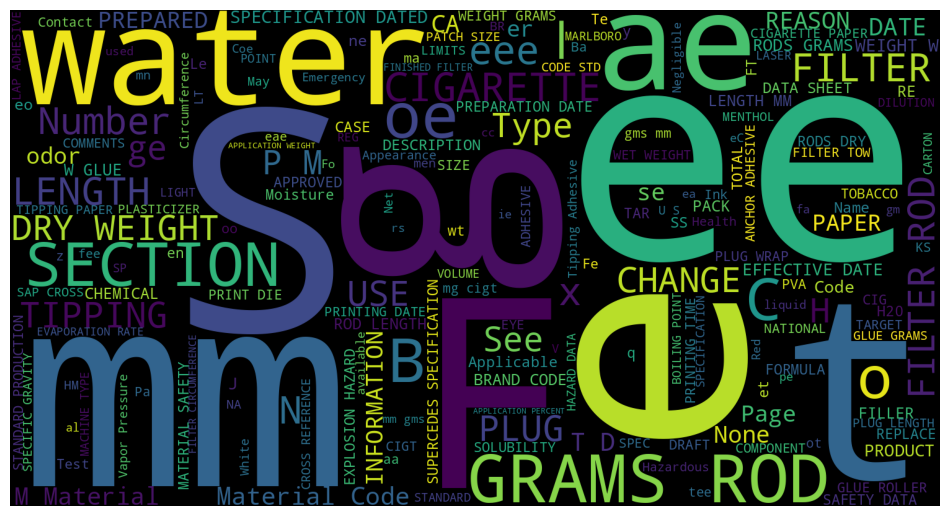




###################################################################################################################################################### 

Image Class : 8


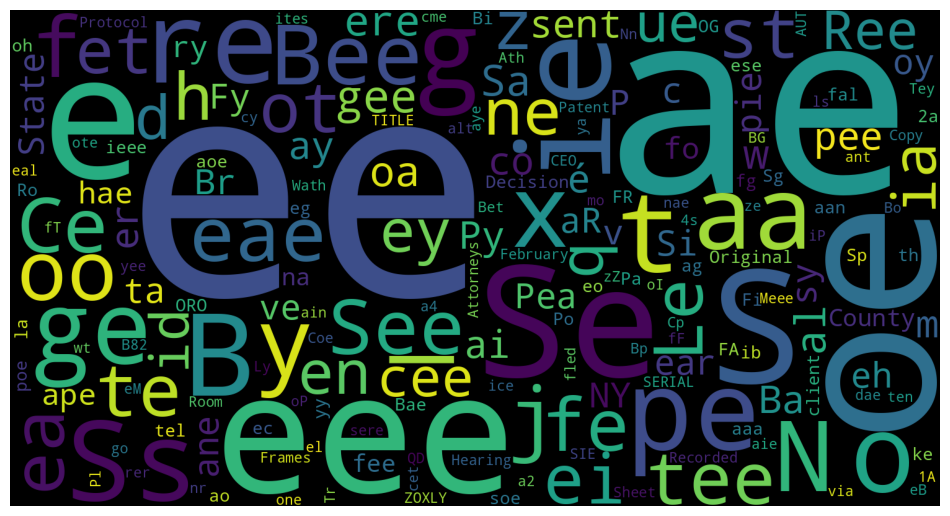




###################################################################################################################################################### 

Image Class : 9


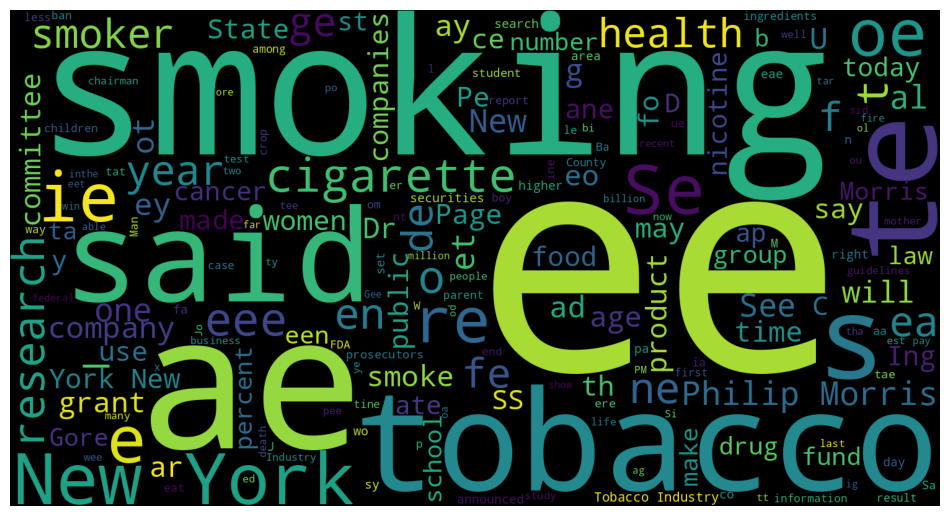




###################################################################################################################################################### 



In [10]:
from wordcloud import WordCloud, STOPWORDS

def wordcloud(words, stops):
    
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color = 'black', 
                    stopwords = stops, 
                    max_font_size = 500).generate(words)
    plt.figure(figsize = (12, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.show()


for image_class in text_df["image_class"].unique():
    print("Image Class :", image_class)
    class_text = ''.join(text_df[text_df["image_class"]==image_class]['text'])
    wordcloud(class_text, set(STOPWORDS))
    print("\n"*2)
    print("#"*150,"\n")

Image Class : 0


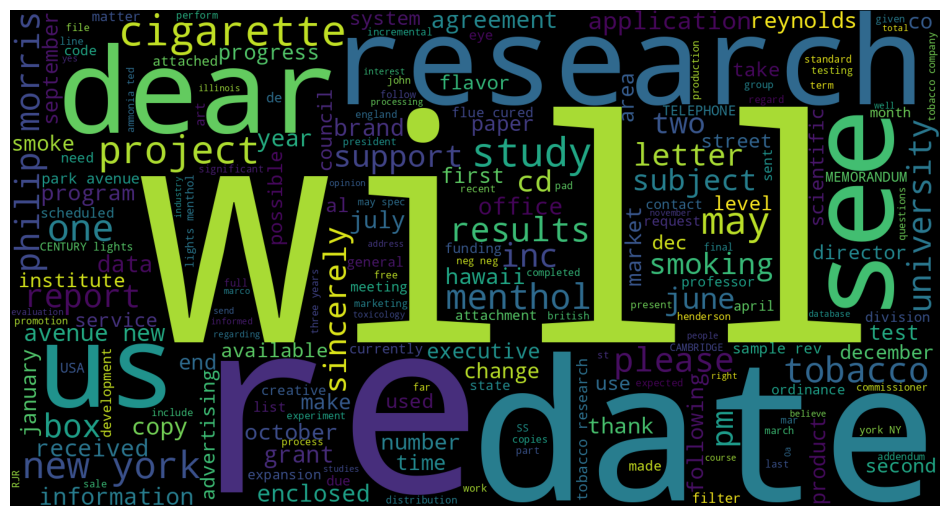




###################################################################################################################################################### 

Image Class : 1


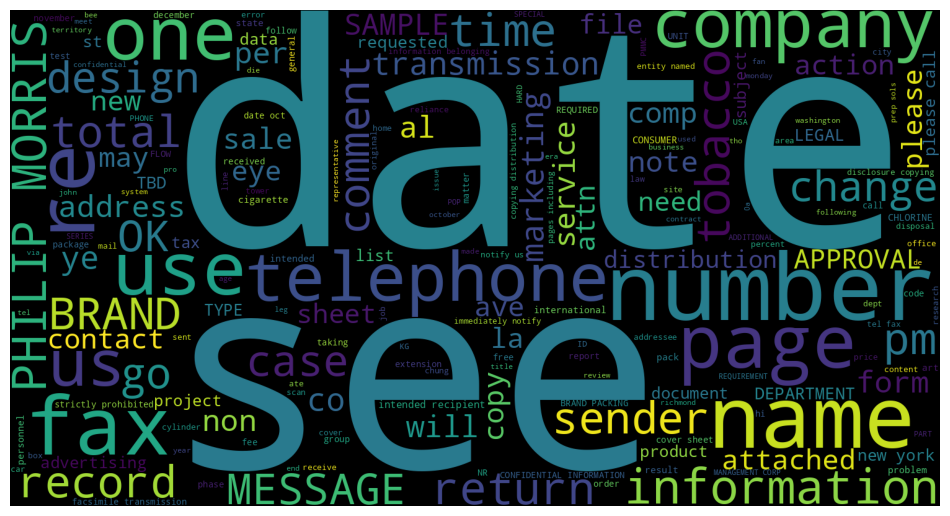




###################################################################################################################################################### 

Image Class : 10


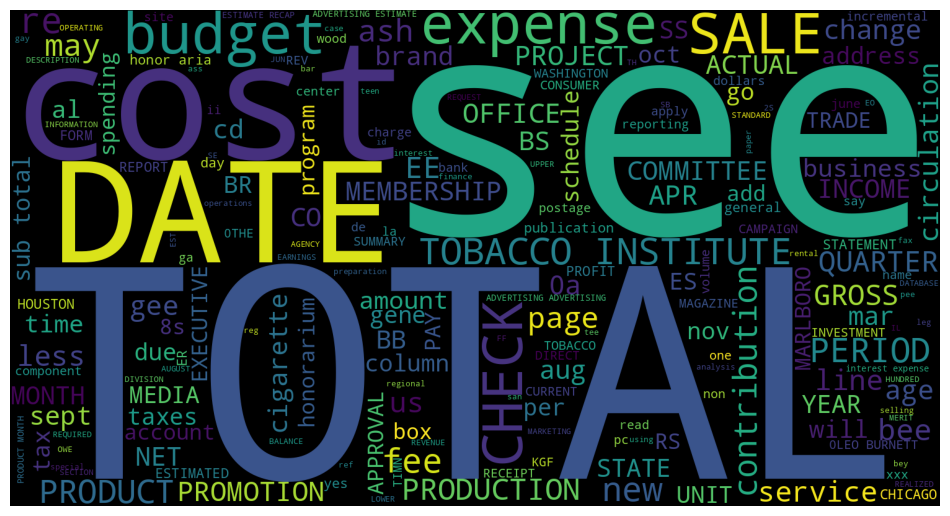




###################################################################################################################################################### 

Image Class : 11


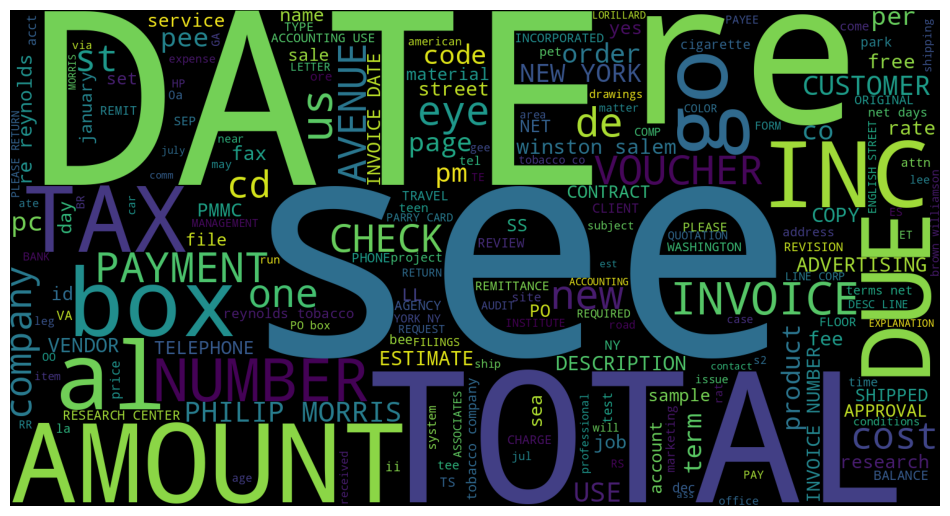




###################################################################################################################################################### 

Image Class : 12


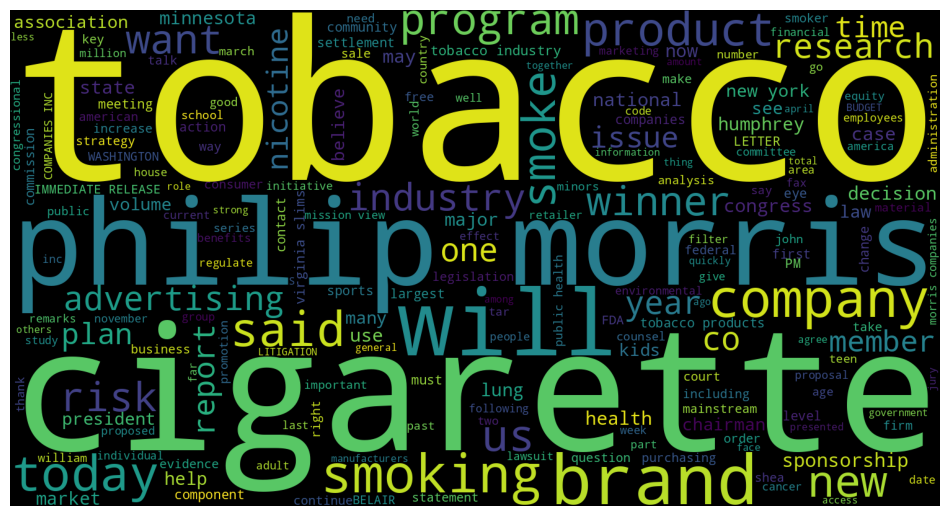




###################################################################################################################################################### 

Image Class : 13


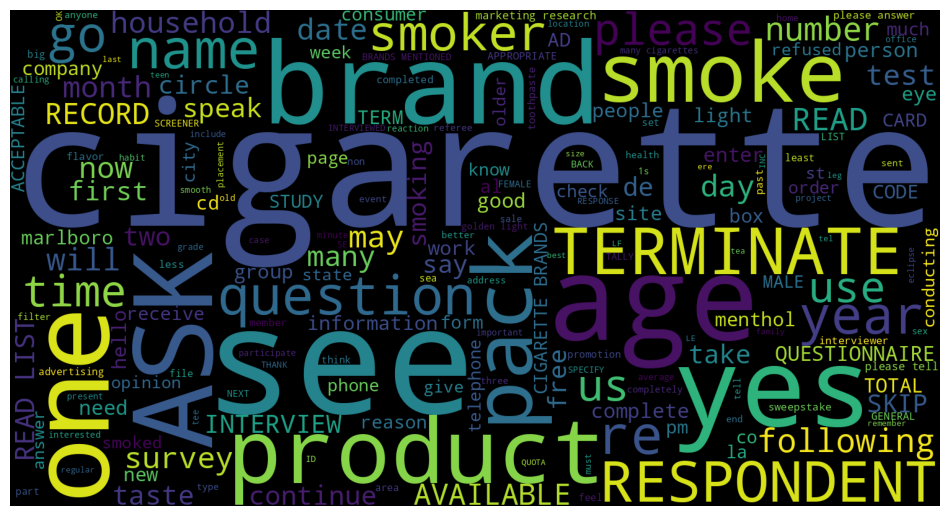




###################################################################################################################################################### 

Image Class : 14


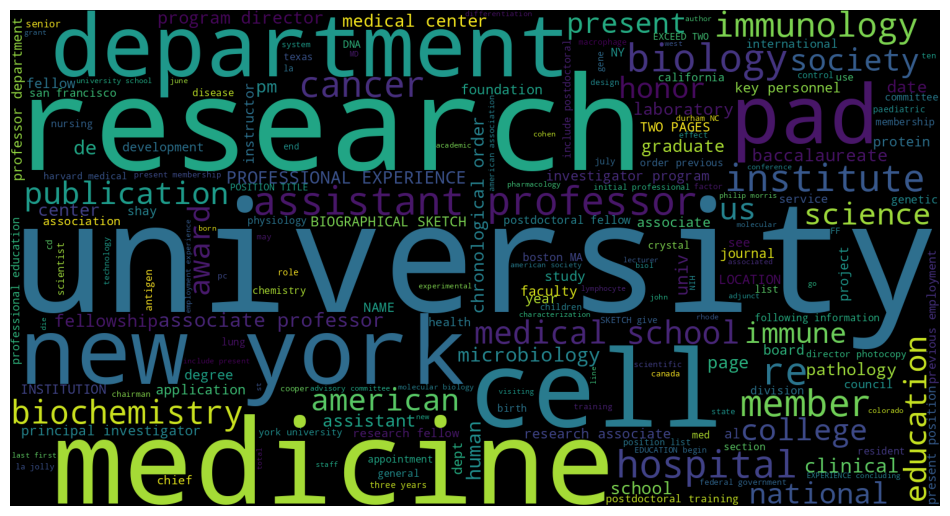




###################################################################################################################################################### 

Image Class : 15


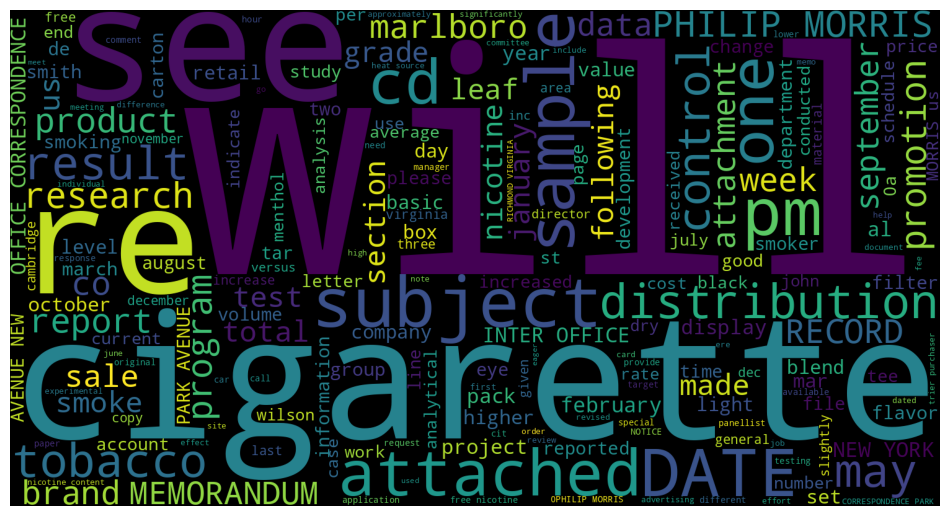




###################################################################################################################################################### 

Image Class : 2


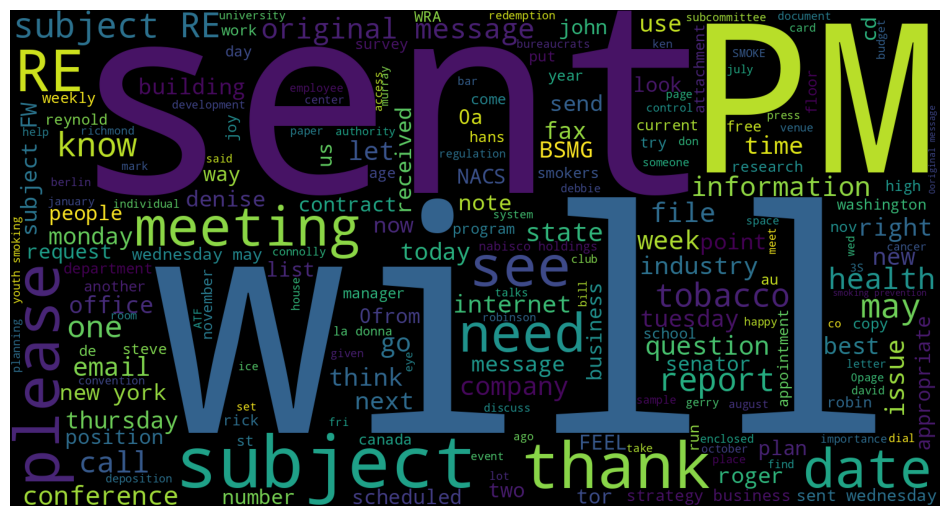




###################################################################################################################################################### 

Image Class : 3


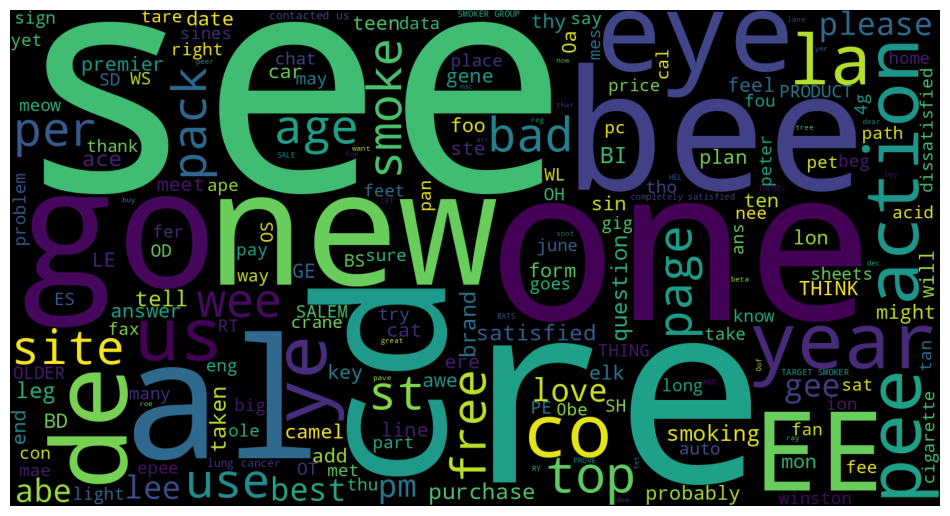




###################################################################################################################################################### 

Image Class : 4


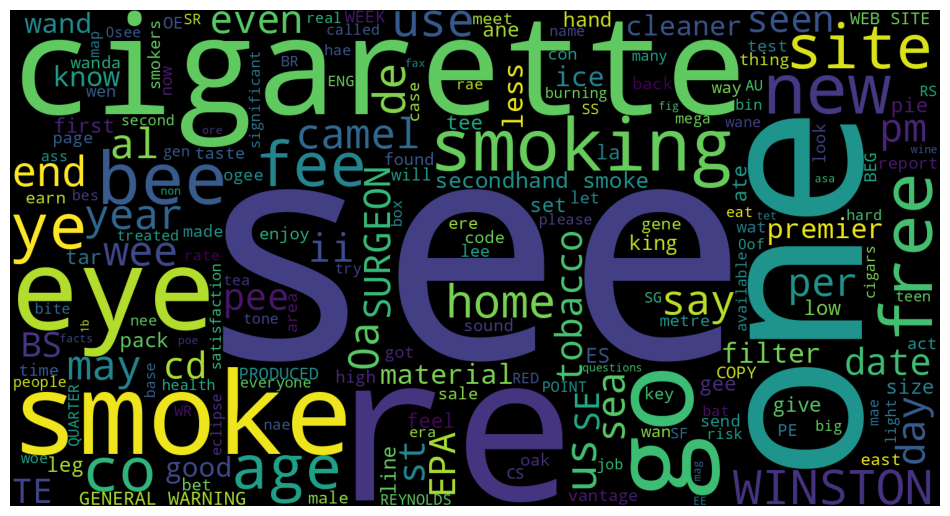




###################################################################################################################################################### 

Image Class : 5


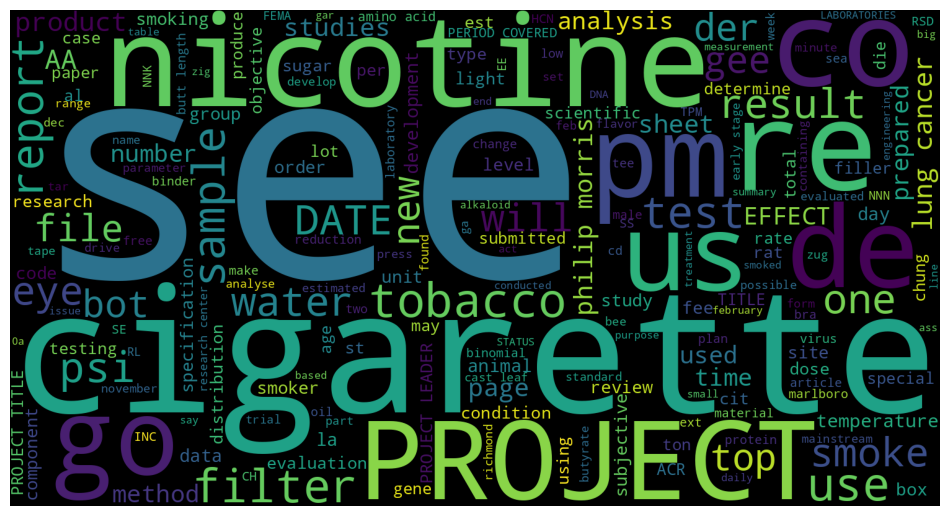




###################################################################################################################################################### 

Image Class : 6


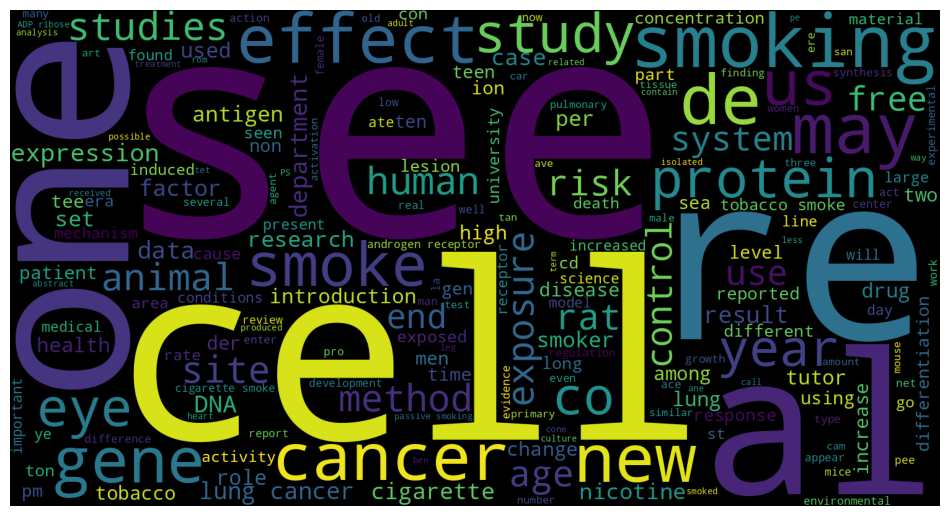




###################################################################################################################################################### 

Image Class : 7


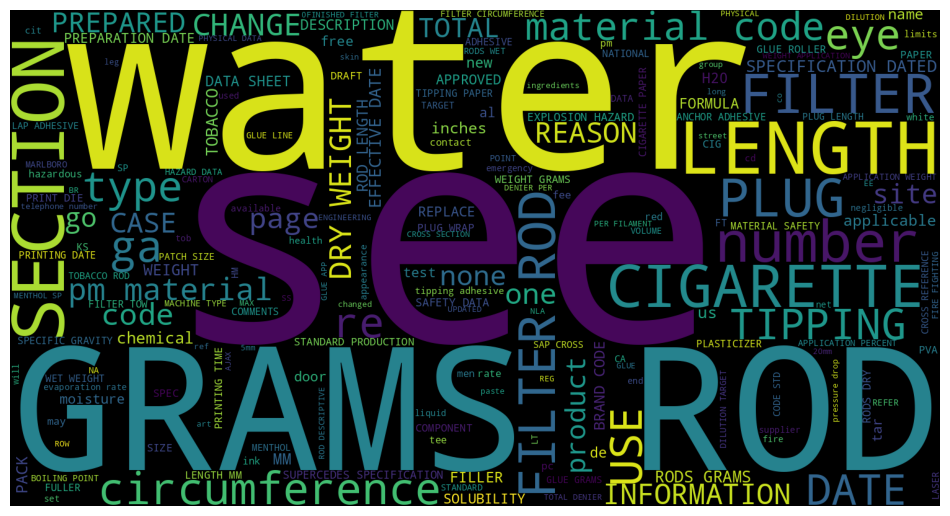




###################################################################################################################################################### 

Image Class : 8


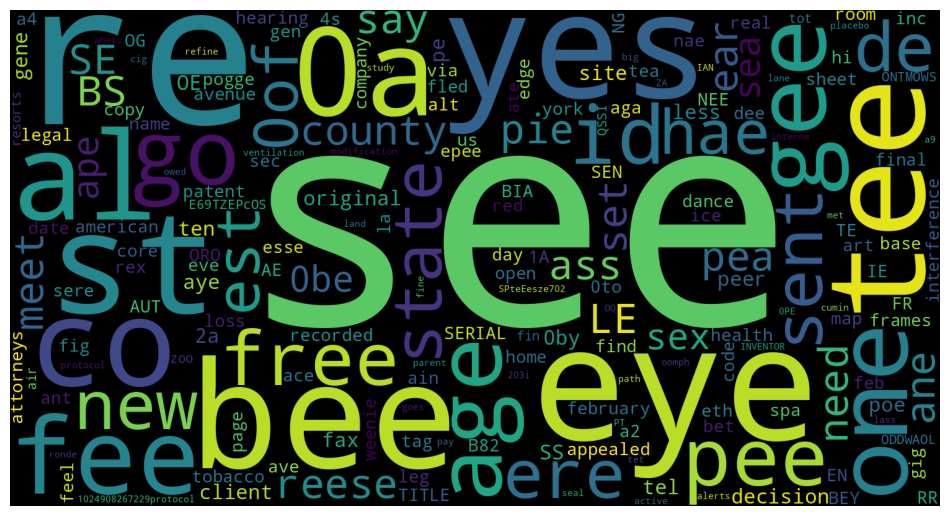




###################################################################################################################################################### 

Image Class : 9


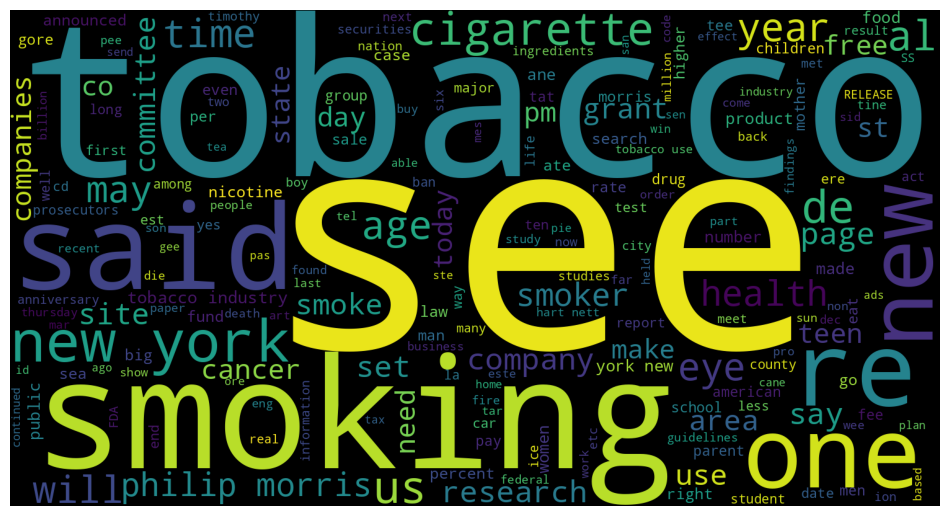




###################################################################################################################################################### 



In [11]:
for image_class in text_df["image_class"].unique():
    print("Image Class :", image_class)
    class_text = ''.join(text_df[text_df["image_class"]==image_class]['text_refined'])
    wordcloud(class_text, set(STOPWORDS))
    print("\n"*2)
    print("#"*150,"\n")

# Basic Text Processing

In [105]:
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [106]:
contraction_dict = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not", "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not", "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",  "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would", "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would", "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam", "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock", "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have", "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as", "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would", "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",  "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is", "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all", "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have","you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have", "you're": "you are", "you've": "you have"}

def _get_contractions(contraction_dict):
    contraction_re = re.compile('(%s)' % '|'.join(contraction_dict.keys()))
    return contraction_dict, contraction_re

contractions, contractions_re = _get_contractions(contraction_dict)

def replace_contractions(text):
    def replace(match):
        return contractions[match.group(0)]
    return contractions_re.sub(replace, text)

# Usage
replace_contractions("this's a text with contraction")

'this is a text with contraction'

In [108]:
from nltk.stem import  SnowballStemmer
from nltk.tokenize.toktok import ToktokTokenizer
# from bs4 import BeautifulSoup
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

def stem_text(text):
    tokenizer = ToktokTokenizer()
    stemmer = SnowballStemmer('english')
    tokens = tokenizer.tokenize(text)
    tokens = [token.strip() for token in tokens]
    tokens = [stemmer.stem(token) for token in tokens]
    return ' '.join(tokens)

def lemma_text(text):
    tokenizer = ToktokTokenizer()
    tokens = tokenizer.tokenize(text)
    tokens = [token.strip() for token in tokens]
    tokens = [wordnet_lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(tokens)



[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/dipanjanchowdhury/nltk_data...


In [117]:
from nltk.corpus import stopwords
from tqdm import tqdm

stopwords = stopwords.words('english')
def process_texts(input_text):
    text = re.sub(r"http\S+", "", input_text)
    # sentance = BeautifulSoup(sentance, 'lxml').get_text()
    text = replace_contractions(text)
    # text = re.sub("\S*\d\S*", "", text).strip()
    text = re.sub('[^A-Za-z]+', ' ', text)
    text = lemma_text(text)
    text = stem_text(text)
    text = ' '.join(e.lower() for e in text.split() if e.lower() not in stopwords).strip()
    return text

In [118]:
text_df['clean_text'] = text_df['text_refined'].apply(lambda x : process_texts(x))

We have evaluted hard text cleaning in the Summarize section.

# NER

In [14]:
text_df.head(10)

,image,image_class,text,text_body,text_refined
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,cairo bis NBIFO institute fair biologist he fo...
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,aqua lisa 2 30 48 to samey PHILIP MORRIS us a ...
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,fare fer pos CG NOC near jar a REYNOLDS TOBACC...
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,a 0 a TY or marco HN roeg holt barn 2h 9 57 ca...
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,in GALLAHER LIMITED no a a a HINGEWAY LONDON W...
5,image_0036.png,0,ae.ne |.oe.f.Awe.¢.¢.§.io].WAVY.MESON POEL COM...,ae.ne .oe.f.Awe.io.WAVY.MESON POEL COMET ORE E...,gene of awe to WAVY MESON POEL COMET ORE ETON ...
6,image_0535.png,0,—af.THERAPY AIR SUPPORT SYSTEMS INC..19912 PON...,af.THERAPY AIR SUPPORT SYSTEMS INC.19912 PONDE...,of THERAPY AIR SUPPORT SYSTEMS INC 19912 PONDE...
7,image_0534.png,0,Guu._.Southern Illinois.University at Carbonda...,Guu._.Southern Illinois.University at Carbonda...,guy southern illinois university at carbon dal...
8,image_0050.png,0,"ee Aorta, Beas Re oy ory.Be eae OE Soe TAKES.«...",ee Aorta Beas Re oy ory.Be eae OE Soe TAKES.Re...,be aorta be as re of or be eye OE see TAKES re...
9,image_0722.png,0,"Wy 7.QO syaniosph ctor o>, em.ra 31 Dawson Ave...",Wy 7.QO syaniosph ctor o em.ra 31 Dawson Avenu...,by 7 QO spanish actor poem a 31 dawson avenue ...


In [15]:
import spacy

# Load the spaCy English model
nlp = spacy.load('en_core_web_lg',disable=["tagger", "parser", "attribute_ruler", "lemmatizer"])
nlp_trf = spacy.load('en_core_web_trf',disable=["tagger", "parser", "attribute_ruler", "lemmatizer"])



def get_entity_dict(text,nlp_model):

    doc = nlp_model(text)
    # Extract and print named entities
    entity_dict = {}

    for ent in doc.ents:
        entity_dict[str(ent.text)] =  str(ent.label_)

    return entity_dict 
        


Let's Evalute the NER Models in both RAW and Refined Text

In [16]:
print("RAW TEXT :\n",text_df["text"][0],"\n")
print("REfined Text :\n",text_df["text_refined"][0])

RAW TEXT :
 nairo |.Bis {NBIFO Institut fiir biologische Forschung GmbH.Vertragsforschung.DEPT. BC.Rion ease) 203982.‘Blox 289 200362.Ree Aare bid.Dresdner Bank AG Koln.Fo 9922 741 Uz 57080040).Slaclspatasse Kain..Sorazise uz sroso19e).Posechocs Kain..ee iSb0 82-504 (LZ 37010080).“RRGIFD institut Wr biologische Forschung FuggerstiaGe 3 0.5000 Kéin 90..Dr. A. Swart:.Dept. Biological Toxicology..TNO-CIVO Toxicology and Nutrition Institute.P.O. Box 360.VB1335/AZ-HE.zai 08, Oot-89.ben HEM / MAO.UneerZeichen 3134 TNO «LET.pwr.NL-3700 Ad Zeist.The Netherlands.Sr iks |}.Koin 28-Nov-89.qy.e.: Lung function determinations for the INBIFO study P 0500/3136.‘and the CRC study B6005.aay.Dear Doctor Zwart:.hank you very much for submitting your preliminary reports fo URC.Thank Vero reyarding the lung function determinations carried out..and Te above mentioned studies. We discussed both reports and..jn ld like to make the following comments..with xegard to the determinations of tidal volume, breathin

In [17]:

print("RAW TEXT :\n",get_entity_dict(text_df["text"][0],nlp),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][0],nlp))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][5],nlp),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][5],nlp))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][21],nlp),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][21],nlp))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][90],nlp),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][90],nlp))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][150],nlp),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][150],nlp))
print("#"*50,"\n")

RAW TEXT :
 {'nairo |.Bis': 'ORG', 'NBIFO Institut fiir biologische Forschung GmbH.Vertragsforschung': 'ORG', '203982.‘Blox': 'CARDINAL', 'Aare': 'PERSON', 'Dresdner Bank AG Koln': 'ORG', 'Kain': 'PERSON', '82-504': 'CARDINAL', '37010080).“RRGIFD': 'CARDINAL', 'Wr biologische Forschung FuggerstiaGe': 'PERSON', '3': 'CARDINAL', '0.5000': 'CARDINAL', 'TNO': 'ORG', 'Nutrition Institute': 'ORG', 'P.O. Box': 'FAC', '360.VB1335': 'CARDINAL', 'AZ': 'GPE', 'HEM': 'ORG', 'NL-3700 Ad Zeist': 'PERSON', 'Netherlands': 'GPE', '28': 'CARDINAL', '0500/3136.‘and': 'CARDINAL', 'CRC': 'ORG', 'URC.Thank': 'ORG', 'xegard': 'PRODUCT', 'Yaency': 'PERSON', 'Jand': 'GPE', 'vould': 'PERSON', 'tabutarton': 'PERSON', 'onfues': 'ORG', 'meatividual data': 'ORG', 'Forced': 'ORG', 'Toxicology Tribune': 'ORG', '4': 'CARDINAL', 'Gasetacat Kon': 'PERSON', '8': 'CARDINAL', '267,28': 'CARDINAL', 'Ona D..te der Genera': 'PERSON', 'Avake Re-.strained Small Experimental Animals, Toxicology Tribune': 'ORG', 'der Gesetachalt'

In [30]:

print("RAW TEXT :\n",get_entity_dict(text_df["text"][0],nlp_trf),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][0],nlp_trf))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][5],nlp_trf),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][5],nlp_trf))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][21],nlp_trf),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][21],nlp_trf))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][90],nlp_trf),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][90],nlp_trf))
print("#"*50,"\n")

print("RAW TEXT :\n",get_entity_dict(text_df["text"][150],nlp_trf),"\n")
print("REfined Text :\n",get_entity_dict(text_df["text_refined"][150],nlp_trf))
print("#"*50,"\n")

RAW TEXT :
 {'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'A. Swart:.Dept': 'PERSON', 'TNO-CIVO Toxicology and Nutrition Institute': 'ORG', 'The Netherlands': 'GPE', '28-Nov-89.qy.e.:': 'DATE', 'Vero': 'ORG', '4 8.‘ede': 'CARDINAL', 'Ona D..te der Genera': 'ORG', 'Koln': 'ORG', '2.': 'CARDINAL'} 

REfined Text :
 {'cairo': 'GPE', 'chung mph': 'PERSON', 'dresden bank AG': 'ORG', 'us': 'GPE', 'tasse kain': 'PERSON', 'kain': 'PERSON', '28 nov 89': 'DATE', 'wart': 'PERSON', 'booster': 'PERSON', 'poe ere': 'PERSON', 'TNO': 'ORG', 'tribune 4 1988 1988': 'DATE', 'october 1959': 'DATE', '4': 'CARDINAL', '390': 'CARDINAL'}
################################################## 

RAW TEXT :
 {'April 3, 1974.oa.yar?.Mr Charles': 'DATE', 'Allen-Martin Productions.9701': 'ORG', 'Taylorsville Road': 'FAC', 'Louisville': 'GPE', 'Kentucky': 'GPE', 'W ley’': 'PERSON', 'VICEROY,.four': 'ORG', 'Time': 'ORG', '-MG-74 IL.2': 'PRODUCT', '33': 'CARDINAL', 'Pleasc': 'ORG', '30%': 'PERCENT', '10"': 'QUANTITY', '16"'



#### Named Entity Recognition Decisions

There are 3 decisions we need to make:

##### 1. Is all Entities needed?

- No, we can only use the GPE, ORG tags to identify Locations and Organizations involved as mentioned location is a key feature, with organization it can help the contextual embedding models to undertsand where it is located.

##### 2. Which text to use?

- Raw text is behaving better for ORG and GPE extractions. 

#### 3. Which Model to Use?

- `en_core_web_trf` or the Transformers model is giving more defined results than `en_core_web_lg` model as it holds contextual meaning of the data and avoids hallucinations. We can look into some of the examples below.

```python
# Raw Text Example
{
  'nairo': 'GPE',
  'Dresdner Bank AG': 'ORG',
  'A. Swart:.Dept': 'PERSON',
  'TNO-CIVO Toxicology and Nutrition Institute': 'ORG',
  'The Netherlands': 'GPE',
  '28-Nov-89.qy.e.:': 'DATE',
  'Vero': 'ORG',
  '4 8.‘ede': 'CARDINAL',
  'Ona D..te der Genera': 'ORG',
  'Koln': 'ORG',
  '2.': 'CARDINAL'
}
```






In [18]:
nlp_trf = spacy.load('en_core_web_trf',disable=["tagger", "parser", "attribute_ruler", "lemmatizer"])



def get_entity_dict(text):

    doc = nlp_trf(text)
    # Extract and print named entities
    entity_dict = {}

    for ent in doc.ents:
        if  str(ent.label_) in ['GPE','ORG']:
            entity_dict[str(ent.text)] =  str(ent.label_)

    return entity_dict 

In [19]:
text_df['entites'] = text_df["text"].apply(lambda x: get_entity_dict(x))

In [20]:
text_df.head(10)

,image,image_class,text,text_body,text_refined,entites
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,cairo bis NBIFO institute fair biologist he fo...,"{'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'T..."
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,aqua lisa 2 30 48 to samey PHILIP MORRIS us a ...,"{'NEW YORK': 'GPE', 'N.Y': 'GPE', 'May & Speh,..."
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,fare fer pos CG NOC near jar a REYNOLDS TOBACC...,{'R.J. REYNOLDS TOBACCO COMPANY.WINSTON': 'ORG...
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,a 0 a TY or marco HN roeg holt barn 2h 9 57 ca...,"{'the Netherlands).To': 'GPE', 'Medical Colleg..."
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,in GALLAHER LIMITED no a a a HINGEWAY LONDON W...,"{'GALLAHER LIMITED.nO': 'ORG', 'LONDON': 'GPE'..."
5,image_0036.png,0,ae.ne |.oe.f.Awe.¢.¢.§.io].WAVY.MESON POEL COM...,ae.ne .oe.f.Awe.io.WAVY.MESON POEL COMET ORE E...,gene of awe to WAVY MESON POEL COMET ORE ETON ...,"{'Allen-Martin Productions.9701': 'ORG', 'Loui..."
6,image_0535.png,0,—af.THERAPY AIR SUPPORT SYSTEMS INC..19912 PON...,af.THERAPY AIR SUPPORT SYSTEMS INC.19912 PONDE...,of THERAPY AIR SUPPORT SYSTEMS INC 19912 PONDE...,"{'af.': 'ORG', 'THERAPY AIR SUPPORT SYSTEMS IN..."
7,image_0534.png,0,Guu._.Southern Illinois.University at Carbonda...,Guu._.Southern Illinois.University at Carbonda...,guy southern illinois university at carbon dal...,"{'University at Carbondale': 'ORG', 'Carbondal..."
8,image_0050.png,0,"ee Aorta, Beas Re oy ory.Be eae OE Soe TAKES.«...",ee Aorta Beas Re oy ory.Be eae OE Soe TAKES.Re...,be aorta be as re of or be eye OE see TAKES re...,"{'RICHMOND': 'GPE', 'VIRGINIA': 'GPE', 'Watert..."
9,image_0722.png,0,"Wy 7.QO syaniosph ctor o>, em.ra 31 Dawson Ave...",Wy 7.QO syaniosph ctor o em.ra 31 Dawson Avenu...,by 7 QO spanish actor poem a 31 dawson avenue ...,"{'West Haven': 'GPE', 'Connecticut': 'GPE', 'U..."


# Keyword Extraction

In [21]:
import yake

language = "en"
max_ngram_size = 3
deduplication_threshold = 0.9
deduplication_algo = 'seqm'
windowSize = 6
numOfKeywords = 15

text = text_df['text'][0]

custom_kw_extractor = yake.KeywordExtractor(lan=language, n=max_ngram_size, dedupLim=deduplication_threshold, dedupFunc=deduplication_algo, windowsSize=windowSize, top=numOfKeywords, features=None)
keywords = custom_kw_extractor.extract_keywords(text)

for kw in keywords:
    print(kw)

# Uses stopwords for english from NLTK, and all puntuation characters by
# default



('NBIFO Institut fiir', 0.0008991918503502866)
('fiir biologische Forschung', 0.0022325044632682907)
('Institut fiir biologische', 0.0028522691090524174)
('biologische Forschung FuggerstiaGe', 0.006181251084391784)
('NBIFO Institut', 0.006741424597062735)
('biologische Forschung', 0.008289901532054738)
('Aare bid.Dresdner Bank', 0.012175032567629156)
('Institut fiir', 0.016384532935881324)
('Lung function determinations', 0.021503301275856614)
('Slaclspatasse Kain.', 0.02166130955244402)
('Posechocs Kain.', 0.02166130955244402)
('RRGIFD institut', 0.022197552790238145)
('fiir biologische', 0.022349083720336328)
('Toxicology Tribune', 0.034310402239569854)
('Forschung FuggerstiaGe', 0.03451380353396329)


In [22]:
def get_keywords(text):

    language = "en"
    max_ngram_size = 3
    deduplication_threshold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 6
    numOfKeywords = 15
    
    custom_kw_extractor = yake.KeywordExtractor(lan=language, n=max_ngram_size, dedupLim=deduplication_threshold, dedupFunc=deduplication_algo, windowsSize=windowSize, top=numOfKeywords, features=None)
    keywords = custom_kw_extractor.extract_keywords(text)

    keyword_list = [each_keyword[0] for each_keyword in keywords]
    return keyword_list

get_keywords(text)

['NBIFO Institut fiir',
 'fiir biologische Forschung',
 'Institut fiir biologische',
 'biologische Forschung FuggerstiaGe',
 'NBIFO Institut',
 'biologische Forschung',
 'Aare bid.Dresdner Bank',
 'Institut fiir',
 'Lung function determinations',
 'Slaclspatasse Kain.',
 'Posechocs Kain.',
 'RRGIFD institut',
 'fiir biologische',
 'Toxicology Tribune',
 'Forschung FuggerstiaGe']

In [23]:
text_df['keywords'] = text_df['text'].apply(lambda x : get_keywords(x))


In [24]:
text_df.head(10)

,image,image_class,text,text_body,text_refined,entites,keywords
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,cairo bis NBIFO institute fair biologist he fo...,"{'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'T...","[NBIFO Institut fiir, fiir biologische Forschu..."
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,aqua lisa 2 30 48 to samey PHILIP MORRIS us a ...,"{'NEW YORK': 'GPE', 'N.Y': 'GPE', 'May & Speh,...","[proprietary and confidential, Marketing and C..."
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,fare fer pos CG NOC near jar a REYNOLDS TOBACC...,{'R.J. REYNOLDS TOBACCO COMPANY.WINSTON': 'ORG...,"[retailers and vendors, WINSTON SUPER KING, SU..."
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,a 0 a TY or marco HN roeg holt barn 2h 9 57 ca...,"{'the Netherlands).To': 'GPE', 'Medical Colleg...","[cigarette-butts of cigarettes, Negus.Director..."
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,in GALLAHER LIMITED no a a a HINGEWAY LONDON W...,"{'GALLAHER LIMITED.nO': 'ORG', 'LONDON': 'GPE'...","[loos of Inporial, vious of tho.Leet, Coneurer..."
5,image_0036.png,0,ae.ne |.oe.f.Awe.¢.¢.§.io].WAVY.MESON POEL COM...,ae.ne .oe.f.Awe.io.WAVY.MESON POEL COMET ORE E...,gene of awe to WAVY MESON POEL COMET ORE ETON ...,"{'Allen-Martin Productions.9701': 'ORG', 'Loui...","[POEL COMET ORE, WAVY.MESON POEL COMET, COMET ..."
6,image_0535.png,0,—af.THERAPY AIR SUPPORT SYSTEMS INC..19912 PON...,af.THERAPY AIR SUPPORT SYSTEMS INC.19912 PONDE...,of THERAPY AIR SUPPORT SYSTEMS INC 19912 PONDE...,"{'af.': 'ORG', 'THERAPY AIR SUPPORT SYSTEMS IN...","[EFFECTIVE THERAPY BEDS, AIR SUPPORT SYSTEMS, ..."
7,image_0534.png,0,Guu._.Southern Illinois.University at Carbonda...,Guu._.Southern Illinois.University at Carbonda...,guy southern illinois university at carbon dal...,"{'University at Carbondale': 'ORG', 'Carbondal...","[Capacity of Nicotine, completion of the.proje..."
8,image_0050.png,0,"ee Aorta, Beas Re oy ory.Be eae OE Soe TAKES.«...",ee Aorta Beas Re oy ory.Be eae OE Soe TAKES.Re...,be aorta be as re of or be eye OE see TAKES re...,"{'RICHMOND': 'GPE', 'VIRGINIA': 'GPE', 'Watert...","[RESEARCH CENTER, Soe TAKES., eae OE Soe, July..."
9,image_0722.png,0,"Wy 7.QO syaniosph ctor o>, em.ra 31 Dawson Ave...",Wy 7.QO syaniosph ctor o em.ra 31 Dawson Avenu...,by 7 QO spanish actor poem a 31 dawson avenue ...,"{'West Haven': 'GPE', 'Connecticut': 'GPE', 'U...","[arrive in England, Dawson Avenue.West Haven, ..."


In [28]:
for i in range(10):
    print("Image Name:",text_df['image'][i], "|","Image Class:", text_df["image_class"][i])
    print('RAW TEXT:' )
    print(text_df['text'][i],'\n')
    print('Clean TEXT:' )
    print(text_df['text_body'][i],'\n')
    print('Refined TEXT:' )
    print(text_df['text_refined'][i],'\n')
    print("#"* 100 ,"\n\n")
    


Image Name: image_0794.png | Image Class: 0
RAW TEXT:
nairo |.Bis {NBIFO Institut fiir biologische Forschung GmbH.Vertragsforschung.DEPT. BC.Rion ease) 203982.‘Blox 289 200362.Ree Aare bid.Dresdner Bank AG Koln.Fo 9922 741 Uz 57080040).Slaclspatasse Kain..Sorazise uz sroso19e).Posechocs Kain..ee iSb0 82-504 (LZ 37010080).“RRGIFD institut Wr biologische Forschung FuggerstiaGe 3 0.5000 Kéin 90..Dr. A. Swart:.Dept. Biological Toxicology..TNO-CIVO Toxicology and Nutrition Institute.P.O. Box 360.VB1335/AZ-HE.zai 08, Oot-89.ben HEM / MAO.UneerZeichen 3134 TNO «LET.pwr.NL-3700 Ad Zeist.The Netherlands.Sr iks |}.Koin 28-Nov-89.qy.e.: Lung function determinations for the INBIFO study P 0500/3136.‘and the CRC study B6005.aay.Dear Doctor Zwart:.hank you very much for submitting your preliminary reports fo URC.Thank Vero reyarding the lung function determinations carried out..and Te above mentioned studies. We discussed both reports and..jn ld like to make the following comments..with xegard to th

# Summarize and Save Findings

Looking at the documents, we can conclude RAW Text are giving better results than Spell Corrected text and Basic Processed Texts.



In [29]:
text_df.head()

,image,image_class,text,text_body,text_refined,entites,keywords
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,cairo bis NBIFO institute fair biologist he fo...,"{'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'T...","[NBIFO Institut fiir, fiir biologische Forschu..."
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,aqua lisa 2 30 48 to samey PHILIP MORRIS us a ...,"{'NEW YORK': 'GPE', 'N.Y': 'GPE', 'May & Speh,...","[proprietary and confidential, Marketing and C..."
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,fare fer pos CG NOC near jar a REYNOLDS TOBACC...,{'R.J. REYNOLDS TOBACCO COMPANY.WINSTON': 'ORG...,"[retailers and vendors, WINSTON SUPER KING, SU..."
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,a 0 a TY or marco HN roeg holt barn 2h 9 57 ca...,"{'the Netherlands).To': 'GPE', 'Medical Colleg...","[cigarette-butts of cigarettes, Negus.Director..."
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,in GALLAHER LIMITED no a a a HINGEWAY LONDON W...,"{'GALLAHER LIMITED.nO': 'ORG', 'LONDON': 'GPE'...","[loos of Inporial, vious of tho.Leet, Coneurer..."


In [30]:
text_df = text_df.drop(columns=["text_refined"],axis=1)


In [31]:
text_df.to_csv(datasets_data_dir+"/text_keywords_data.csv",index=False)

In [3]:
text_dataset_path = datasets_data_dir+"/text_keywords_data.csv"

text_df = pd.read_csv(text_dataset_path)

In [4]:
text_df.head()

,image,image_class,text,text_body,entites,keywords
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,"{'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'T...","['NBIFO Institut fiir', 'fiir biologische Fors..."
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,"{'NEW YORK': 'GPE', 'N.Y': 'GPE', 'May & Speh,...","['proprietary and confidential', 'Marketing an..."
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,{'R.J. REYNOLDS TOBACCO COMPANY.WINSTON': 'ORG...,"['retailers and vendors', 'WINSTON SUPER KING'..."
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,"{'the Netherlands).To': 'GPE', 'Medical Colleg...","['cigarette-butts of cigarettes', 'Negus.Direc..."
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,"{'GALLAHER LIMITED.nO': 'ORG', 'LONDON': 'GPE'...","['loos of Inporial', 'vious of tho.Leet', 'Con..."


# Profiling Text Data 

This process is to create additional features with respect to the text.
1. Text and Character level features are created with this apporach.
2. Sentiment of text might also add some value as some images are tobacco research findings, posters, raw materials, industrial hazards.
3. Low Word Count rate might help us to classify images are Only Images, Handwritten texts, Mails.


In [5]:
from nlp_profiler.core import apply_text_profiling

profiled_data = apply_text_profiling(text_df, 'text_body')

/Users/dipanjanchowdhury/Documents/Labs/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/dipanjanchowdhury/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/dipanjanchowdhury/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/dipanjanchowdhury/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
Unzipping /var/folders/dz/mr6z8kr93gg0d2v8h2md41b00000gn/T/tmpvcs80ol2.zip to /Users/dipanjanchowdhury/.cache/language_tool_python.
Downloaded https://www.languagetool.org/download/LanguageTool-5.7.zip to /Users/d

final params: {'high_level': True, 'granular': True, 'grammar_check': False, 'spelling_check': True, 'parallelisation_method': 'default'}


  0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         | 0/3 [00:00<?, ?it/s]/Users/dipanjanchowdhury/Documents/Labs/.venv/lib/python3.11/site-packages/joblib/_store_backends.py

In [12]:
profiled_data.head()

,text_body,sentences_count,characters_count,spaces_count,count_words,duplicates_count,chars_excl_spaces_count,emoji_count,whole_numbers_count,alpha_numeric_count,...,noun_phase_count,sentiment_polarity_score,sentiment_polarity,sentiment_polarity_summarised,sentiment_subjectivity_score,sentiment_subjectivity,sentiment_subjectivity_summarised,spelling_quality_score,spelling_quality,spelling_quality_summarised
0,nairo .Bis NBIFO Institut fiir biologische For...,12,2256,319,346,37,1937,0,42,1852,...,159,0.130000,Pretty positive,Positive,0.445741,Objective/subjective,Objective/subjective,0.700906,Bad,Bad
1,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,3,1593,199,218,35,1394,0,18,1350,...,122,0.103788,Pretty positive,Positive,0.290404,Pretty objective,Objective,0.807882,Bad,Bad
2,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,3,862,108,142,22,754,0,14,703,...,46,0.291667,Pretty positive,Positive,0.345833,Pretty objective,Objective,0.758929,Bad,Bad
3,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,9,1524,235,264,29,1289,0,11,1240,...,94,-0.289048,Pretty negative,Negative,0.647619,Pretty subjective,Subjective,0.824490,Bad,Bad
4,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,2,1889,278,311,21,1611,0,11,1562,...,159,0.289881,Pretty positive,Positive,0.372173,Pretty objective,Objective,0.589286,Pretty bad,Bad


In [15]:
data_df = pd.concat([text_df,profiled_data.loc[:, profiled_data.columns != 'text_body']],axis=1)
data_df.head()

,image,image_class,text,text_body,entites,keywords,sentences_count,characters_count,spaces_count,count_words,...,noun_phase_count,sentiment_polarity_score,sentiment_polarity,sentiment_polarity_summarised,sentiment_subjectivity_score,sentiment_subjectivity,sentiment_subjectivity_summarised,spelling_quality_score,spelling_quality,spelling_quality_summarised
0,image_0794.png,0,nairo |.Bis {NBIFO Institut fiir biologische F...,nairo .Bis NBIFO Institut fiir biologische For...,"{'nairo': 'GPE', 'Dresdner Bank AG': 'ORG', 'T...","['NBIFO Institut fiir', 'fiir biologische Fors...",12,2256,319,346,...,159,0.130000,Pretty positive,Positive,0.445741,Objective/subjective,Objective/subjective,0.700906,Bad,Bad
1,image_0757.png,0,Aqua L “Risa.2} 30/48.Ro).SMEy.PHILIP MORRIS.‘...,Aqua L Risa.2 3048.Ro.SMEy.PHILIP MORRIS.U.S.A...,"{'NEW YORK': 'GPE', 'N.Y': 'GPE', 'May & Speh,...","['proprietary and confidential', 'Marketing an...",3,1593,199,218,...,122,0.103788,Pretty positive,Positive,0.290404,Pretty objective,Objective,0.807882,Bad,Bad
2,image_0395.png,0,fa) Re fer pos.CG.NOC.Ne.(sR).jae.R.J. REYNOLD...,fa Re fer pos.CG.NOC.Ne.sR.jae.R.J. REYNOLDS T...,{'R.J. REYNOLDS TOBACCO COMPANY.WINSTON': 'ORG...,"['retailers and vendors', 'WINSTON SUPER KING'...",3,862,108,142,...,46,0.291667,Pretty positive,Positive,0.345833,Pretty objective,Objective,0.758929,Bad,Bad
3,image_0427.png,0,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h<9+57....,c.0.P.TY.Dr. Murco HN. Roegholt.Baarn 2h957.ca...,"{'the Netherlands).To': 'GPE', 'Medical Colleg...","['cigarette-butts of cigarettes', 'Negus.Direc...",9,1524,235,264,...,94,-0.289048,Pretty negative,Negative,0.647619,Pretty subjective,Subjective,0.824490,Bad,Bad
4,image_0552.png,0,in.GALLAHER LIMITED.nO aaa.g HINGEWAY + LONDON...,in.GALLAHER LIMITED.nO aaa.g HINGEWAY LONDON W...,"{'GALLAHER LIMITED.nO': 'ORG', 'LONDON': 'GPE'...","['loos of Inporial', 'vious of tho.Leet', 'Con...",2,1889,278,311,...,159,0.289881,Pretty positive,Positive,0.372173,Pretty objective,Objective,0.589286,Pretty bad,Bad


In [17]:
data_df.to_csv(datasets_data_dir+'/text_profiled_data.csv',index=False)

In [19]:
data_df.describe()

,image_class,sentences_count,characters_count,spaces_count,count_words,duplicates_count,chars_excl_spaces_count,emoji_count,whole_numbers_count,alpha_numeric_count,non_alpha_numeric_count,punctuations_count,stop_words_count,dates_count,noun_phase_count,sentiment_polarity_score,sentiment_subjectivity_score,spelling_quality_score
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.0,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.0,1000.000000,1000.000000,1000.000000,1000.000000
mean,7.959000,9.239000,1183.691000,171.086000,187.598000,18.923000,1012.605000,0.0,24.127000,958.18800,225.503000,54.184000,31.454000,0.0,97.102000,0.061725,0.286757,0.592004
std,4.654996,8.928471,1071.166976,162.631983,167.100434,20.218998,913.002255,0.0,26.421676,891.19171,184.762461,32.756757,42.444687,0.0,92.857041,0.142815,0.241668,0.159335
min,0.000000,1.000000,11.000000,0.000000,0.000000,0.000000,11.000000,0.0,0.000000,8.00000,1.000000,1.000000,0.000000,0.0,0.000000,-0.800000,0.000000,0.083333
25%,4.000000,3.000000,380.250000,52.000000,67.000000,3.000000,326.500000,0.0,7.000000,289.50000,88.000000,30.000000,1.000000,0.0,31.000000,0.000000,0.000000,0.479565
50%,8.000000,7.000000,891.000000,126.000000,142.000000,12.000000,753.000000,0.0,16.000000,702.50000,181.000000,49.500000,11.000000,0.0,68.000000,0.010556,0.312917,0.597026
75%,12.000000,13.000000,1638.750000,235.000000,256.000000,29.000000,1398.500000,0.0,32.000000,1336.00000,308.000000,74.000000,47.000000,0.0,128.000000,0.118081,0.454545,0.725372
max,15.000000,70.000000,5800.000000,905.000000,912.000000,100.000000,4943.000000,0.0,283.000000,4793.00000,1007.000000,196.000000,289.000000,0.0,504.000000,0.800000,1.000000,1.000000
